The present EDA is based on the dataset provided by DIJIN (Directorate of Criminal Investigation and INTERPOL of the National Police) and National Police from Colombia, which contains updates about data from all over the country on domestic violence reported between 2010 and 2022, the most recent of which was on December 9 (Last update).

[**Source**](https://www.datos.gov.co/Seguridad-y-Defensa/Reporte-Delito-Violencia-Intrafamiliar-Polic-a-Nac/vuyt-mqpw)

# Dataset import and libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go

from json import load
from urllib.request import urlopen
from plotly.subplots import make_subplots

sns.set_theme(style="ticks", context="talk", palette="tab10")
plt.rcParams.update({'font.size': 12})

In [3]:
with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    counties = load(response)

In [4]:
df = pd.read_parquet('../data/processed/data_cleaned.parquet')

# Understanding data

## Data relationship

Factorizing the dataframe to use categorical data as numeric and proccede to statistics

In [5]:
df_factorize = df.apply(lambda x : pd.factorize(x)[0]).corr(method='pearson', min_periods=1).copy()

As we can see from the heatmap, there's not a big relationship between our categorical data factorized

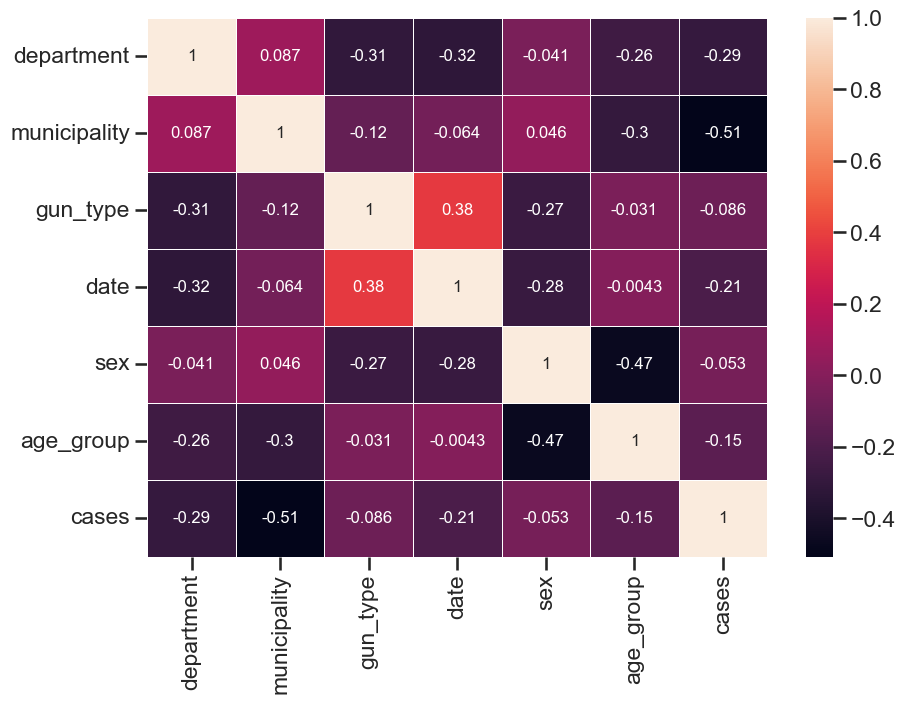

In [6]:
fig, ax = plt.subplots(figsize=(10,7))         # Sample figsize in inches
sns.heatmap(df_factorize.corr(), annot=True, linewidths=.5, ax=ax)
plt.show()

## Distribution of the dataset

### Distribution of factorized data:

Insight 1: there is not a common distribution nor a consistent one.

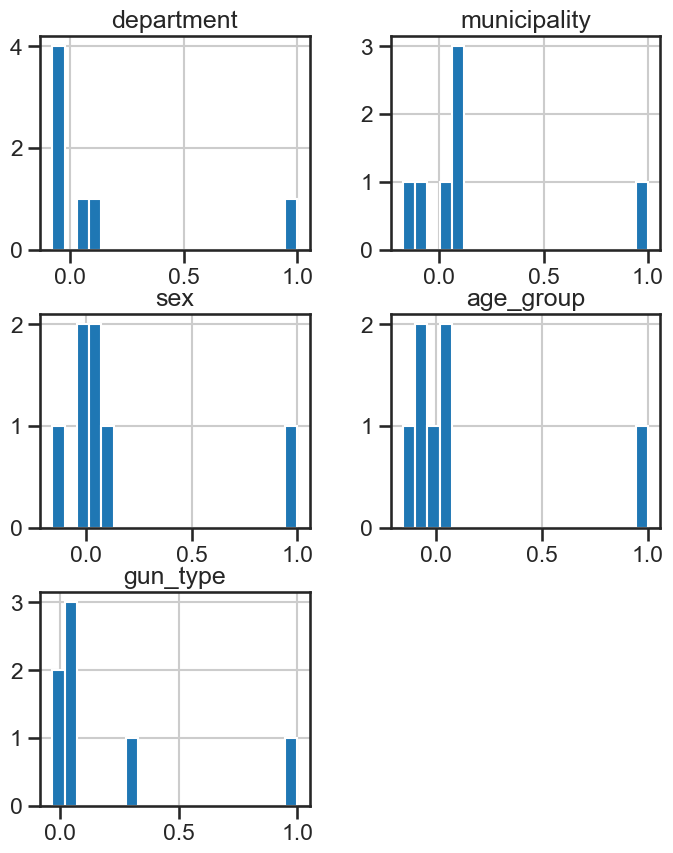

In [7]:
df_factorize.hist(figsize=(8, 10), column=['department', 'municipality', 'sex', 'age_group', 'gun_type'],grid=True, bins=20)
plt.show()

### Distribution of datetime and integer dtype columns

Insight 2: In the date, we can see how 2020 had a great increase on cases, we'll talk about this later in time series analysis.

In the cases, there's a big concentration of 1 to 2 cases per row.

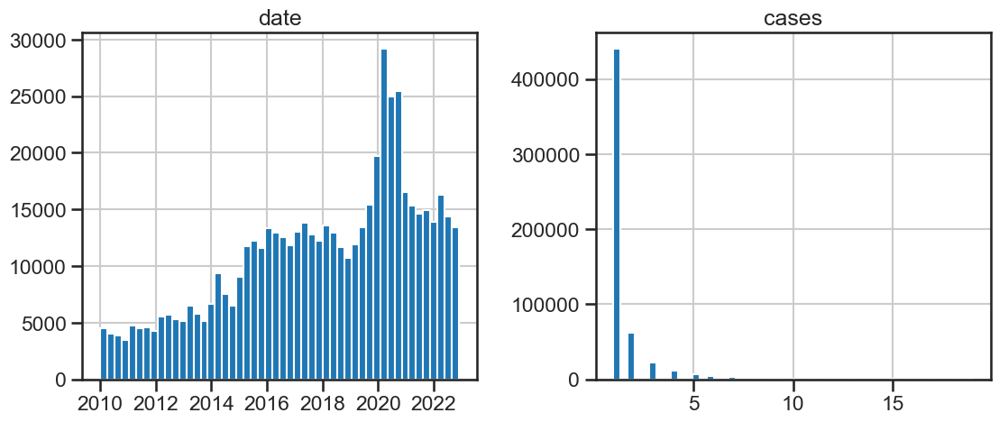

In [8]:
df.hist(figsize=(13, 5), bins=50)
plt.show()

### Dealing with outliers

As seen above and given that each row in the dataset represents a single record, I consider it appropriate to remove records where cases are more than 20, as it is absurd to think that a single incident of domestic violence has been reported with more than 20 victims of violence in one place. This could have been caused by a data entry error, as there are cases that exceed 100.

In [9]:
df[['cases']].query('cases > 20').count()

cases    0
dtype: int64

In [10]:
df = df.query('cases < 20').reset_index(drop=True).copy()

# Data visualization and answering different questions

In [11]:
df.describe(exclude='datetime')

,department,municipality,gun_type,sex,age_group,cases
count,559025,559025,559025,559025,559025,559025.000000
unique,32,1023,5,3,4,NaN
top,CUNDINAMARCA,SANTAFE DE BOGOTA D.C,ARMA BLANCA,FEMENINO,ADULTOS,NaN
freq,99029,54437,319344,425681,490244,NaN
mean,NaN,NaN,NaN,NaN,NaN,1.539797
std,NaN,NaN,NaN,NaN,NaN,1.643525
min,NaN,NaN,NaN,NaN,NaN,1.000000
25%,NaN,NaN,NaN,NaN,NaN,1.000000
50%,NaN,NaN,NaN,NaN,NaN,1.000000
75%,NaN,NaN,NaN,NaN,NaN,1.000000


### Question 1: What department has the most case and how is this distribution?

In [12]:
table_department = pd.pivot_table(df, index = ('department'), values = 'cases', columns = None, aggfunc='count').reset_index()
table_department.sort_values(by='cases', ascending=False)

,department,cases
14,CUNDINAMARCA,99029
1,ANTIOQUIA,68641
29,VALLE DEL CAUCA,52372
26,SANTANDER,44491
6,BOYACA,31474
4,ATLANTICO,20778
28,TOLIMA,20532
17,HUILA,19602
20,META,19359
5,BOLIVAR,18704


Answer question 1 based on graph: the distribution of cases across the country is concentrated on the center part of the country, as expected thanks to the fact that a great amount of population is located on this region.

The right side of the graph shows a logarithm function with base 10 applied to the values from the left part of the graph. This is done solely for the purpose of improving the visual representation of how cases are distributed across the country, and does not reflect the actual distribution of the data.

In [13]:
locs = table_department['department']
for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']

fig = make_subplots(
                rows = 1, cols = 2, subplot_titles = ['Normal distribution', 'Logarithm 10'],
                specs=[[{"type": "mapbox"}, {"type": "mapbox"}]]
)
fig.add_trace(go.Choroplethmapbox(
                    geojson = counties,
                    locations = table_department['department'],
                    z = table_department['cases'],
                    colorbar_title = 'Case count',
                    colorscale = 'YlOrRd',
                    colorbar = dict(thickness = 20, x = 0.46),
                    marker = dict(opacity = 0.75)), row = 1, col = 1)

fig.add_trace(go.Choroplethmapbox(
                    geojson = counties,
                    locations = table_department['department'],
                    z = np.log10(table_department['cases']),
                    colorbar_title = 'Case count (Log10)',
                    colorscale = 'YlOrRd',
                    colorbar = dict(thickness = 20, x = 1.02),
                    marker = dict(opacity = 0.75)), row = 1, col = 2)

fig.update_layout(
                margin = dict(l = 20, r = 0, t = 80, b = 40), title= 'Domestic violence cases distributed over the country, given the Log10 Graph for a better visualization of the variance.',
                mapbox1 = dict(zoom = 3.4, style = 'carto-positron', center = {"lat": 4.570868, "lon": -74.2973328}),
                mapbox2 = dict(zoom = 3.4, style = 'carto-positron', center = {"lat": 4.570868, "lon": -74.2973328})
                )

fig.show()

### Question 2: What type of gun is the most common?

In [14]:
gun_table = pd.pivot_table(df, index = 'gun_type', values = 'cases', columns = None, aggfunc='count',sort=True).reset_index()
gun_table

,gun_type,cases
0,ARMA BLANCA,319344
1,ARMA DE FUEGO,2678
2,ESCOPOLAMINA,3854
3,NO REPORTA,75407
4,SIN EMPLEO DE ARMAS,157742


Answer question 2: The most common type of gun used in domestic violence cases in Colombia is handgun, followed by unarmed. It's interesting to see how handgun is far more used that the others, specially firearm and scopolamine.

In [15]:
gun_graph = px.bar(gun_table, x='gun_type', y='cases', text_auto='.2s')
gun_graph.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
gun_graph.update_xaxes(tickvals=[0, 1, 2, 3, 4], ticktext=['Handgun', 'Firearm', 'Scopolamine ', 'No information', 'Unarmed'])   #Renaming x labels
gun_graph.show()

### Question 3: how sex is distributed? What is the most affected?

Answer question 3: female (FEMENINO) sex is the most common **victim**

In [16]:
df.groupby('sex')['cases'].count()

sex
FEMENINO      425681
MASCULINO     132872
NO REPORTA       472
Name: cases, dtype: int64

In [17]:
dfsex = pd.pivot_table(df, index = ('sex', 'gun_type'), values = 'cases', columns = None, aggfunc='count', sort=True).reset_index()
dfsex

,sex,gun_type,cases
0,FEMENINO,ARMA BLANCA,245327
1,FEMENINO,ARMA DE FUEGO,2248
2,FEMENINO,ESCOPOLAMINA,2975
3,FEMENINO,NO REPORTA,56193
4,FEMENINO,SIN EMPLEO DE ARMAS,118938
5,MASCULINO,ARMA BLANCA,73865
6,MASCULINO,ARMA DE FUEGO,430
7,MASCULINO,ESCOPOLAMINA,877
8,MASCULINO,NO REPORTA,19106
9,MASCULINO,SIN EMPLEO DE ARMAS,38594


In [18]:
dfsex['sex'].replace({'NO REPORTA': np.NaN}, inplace=True)
dfsex = dfsex[~dfsex['sex'].isnull()]

Here, there's a graph comparing how sex victims are distribuited in termns of the type of gun that was used.

In [19]:
fig_sex = px.bar(dfsex, x='sex', y='cases', color='gun_type', barmode='group', text_auto='.2s',
                   title="Graph that shows the sex of victims and the number of cases involving each type of gun",
                   labels={'cases':'Case amount', 'sex':'sex and Gun type'}, height=400)

fig_sex.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig_sex.show()

### Question 4: How are sex and age_group related?

Simple groupby to have an idea of the question:

In [20]:
df.groupby(['sex', 'age_group'])['cases'].count()

sex         age_group   
FEMENINO    ADOLESCENTES     24160
            ADULTOS         385418
            MENORES          16102
            NO REPORTA           1
MASCULINO   ADOLESCENTES     10587
            ADULTOS         104808
            MENORES          17477
            NO REPORTA           0
NO REPORTA  ADOLESCENTES         0
            ADULTOS             18
            MENORES              2
            NO REPORTA         452
Name: cases, dtype: int64

Answer question 4: As observed here, the majority of affected individuals are adult females, whereas there is little variation in the number of affected minors between males and females.

In [21]:
dfsex_age = pd.pivot_table(df, index = ('sex', 'age_group'), values = 'cases', columns = None, aggfunc='count', sort=True).reset_index()
dfsex_age

,sex,age_group,cases
0,FEMENINO,ADOLESCENTES,24160
1,FEMENINO,ADULTOS,385418
2,FEMENINO,MENORES,16102
3,FEMENINO,NO REPORTA,1
4,MASCULINO,ADOLESCENTES,10587
5,MASCULINO,ADULTOS,104808
6,MASCULINO,MENORES,17477
7,MASCULINO,NO REPORTA,0
8,NO REPORTA,ADOLESCENTES,0
9,NO REPORTA,ADULTOS,18


In [22]:
fig_sex_age = px.bar(dfsex_age, x='sex', y='cases', color='age_group', barmode='group', text_auto='.2s',
                   title="Graph that shows the sex of victims and the number of cases involving each type of gun",
                   labels={'cases':'Case amount', 'sex':'sex and Gun type'}, height=400)

fig_sex_age.update_traces(textfont_size=12, textangle=0, textposition="outside", cliponaxis=False)
fig_sex_age.show()

### Scopolamine analysis (hyoscine hydrobromide)

In [23]:
df.head()

,department,municipality,gun_type,date,sex,age_group,cases
0,ATLANTICO,BARRANQUILLA (CT),ARMA BLANCA,2010-01-01,MASCULINO,ADULTOS,1
1,BOYACA,DUITAMA,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1
2,CAQUETA,PUERTO RICO,ARMA BLANCA,2010-01-01,MASCULINO,ADULTOS,1
3,CASANARE,MANÍ,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1
4,CUNDINAMARCA,SANTAFE DE BOGOTA D.C,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1


In [24]:
scopolamine = list(df.index[(df['gun_type'] == 'ESCOPOLAMINA')])
dfsco = pd.DataFrame(df.loc[scopolamine])
dfsco

,department,municipality,gun_type,date,sex,age_group,cases
50040,CUNDINAMARCA,SANTAFE DE BOGOTA D.C,ESCOPOLAMINA,2012-10-22,FEMENINO,ADULTOS,1
50304,VALLE DEL CAUCA,CALI (CT),ESCOPOLAMINA,2012-10-28,FEMENINO,ADULTOS,1
75086,CORDOBA,MONTERÍA (CT),ESCOPOLAMINA,2014-01-01,FEMENINO,ADULTOS,1
75087,CUNDINAMARCA,SANTAFE DE BOGOTA D.C,ESCOPOLAMINA,2014-01-01,FEMENINO,ADULTOS,6
75088,NORTE DE SANTANDER,CÚCUTA (CT),ESCOPOLAMINA,2014-01-01,FEMENINO,ADULTOS,2
...,...,...,...,...,...,...,...
253836,BOLIVAR,MAGANGUÉ,ESCOPOLAMINA,2018-01-28,FEMENINO,ADULTOS,1
253837,CUNDINAMARCA,SOACHA,ESCOPOLAMINA,2018-01-28,FEMENINO,ADULTOS,2
253838,QUINDIO,ARMENIA (CT),ESCOPOLAMINA,2018-01-28,FEMENINO,ADULTOS,1
253839,TOLIMA,IBAGUÉ (CT),ESCOPOLAMINA,2018-01-28,FEMENINO,ADULTOS,1


In [25]:
dfdsco = pd.pivot_table(dfsco, index = 'department', values = 'cases', columns = None, aggfunc='count').reset_index()
dfdsco['department'].replace({'ARCHIPIELAGO DE SAN ANDRES PROVIDENCIA Y SANTA CATALINA':'SAN ANDRES'}, inplace=True)

Insight: It is true that scopolamine usage is concentrated primarily in the central region of the country, with a significant presence observed in Bogotá, the capital of Colombia. This city also has the highest number of cases involving the use of scopolamine in domestic violence incidents, in comparison to other regions.

In [26]:
fig = px.bar(dfdsco, x='cases', y='department', text_auto='.2s',
            title="Number of reports Family violence with scopolamine by department",
            labels={'department':'DEPARTMENT', 'cases':'QUANTITY CASES'},
            orientation='h')

fig.update_traces(textfont_size=12, textangle=0, textposition="outside",cliponaxis=False)
fig.update_layout(width=1200, height=800)
fig.show()

In [27]:
locs = dfdsco['department']

for loc in counties['features']:
    loc['id'] = loc['properties']['NOMBRE_DPT']
fig = go.Figure(go.Choroplethmapbox(
                    geojson=counties,
                    locations=locs,
                    z=np.log10(dfdsco['cases']),
                    colorscale='YlOrRd',
                    colorbar_title="Número"))
fig.update_layout(mapbox_style="carto-positron",
                    mapbox_zoom=3.3,
                    mapbox_center = {"lat": 4.570868, "lon": -74.2973328})
fig.show()

## Time series analysis

In [28]:
print(df.columns, df.dtypes, end='\n')

Index(['department', 'municipality', 'gun_type', 'date', 'sex', 'age_group',
       'cases'],
      dtype='object') department              object
municipality            object
gun_type              category
date            datetime64[ns]
sex                   category
age_group             category
cases                    int64
dtype: object


Added column day and month to know when did the case happened

In [29]:
df['day'] = df['date'].dt.day_name()
df['month'] = df['date'].dt.month_name()

In [30]:
df.head()

,department,municipality,gun_type,date,sex,age_group,cases,day,month
0,ATLANTICO,BARRANQUILLA (CT),ARMA BLANCA,2010-01-01,MASCULINO,ADULTOS,1,Friday,January
1,BOYACA,DUITAMA,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1,Friday,January
2,CAQUETA,PUERTO RICO,ARMA BLANCA,2010-01-01,MASCULINO,ADULTOS,1,Friday,January
3,CASANARE,MANÍ,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1,Friday,January
4,CUNDINAMARCA,SANTAFE DE BOGOTA D.C,ARMA BLANCA,2010-01-01,FEMENINO,ADULTOS,1,Friday,January


In [74]:
new_order_month = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
new_order_day = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df_day = df.groupby('day')['cases'].sum().reindex(new_order_day, axis=0).reset_index()
df_month = df.groupby('month')['cases'].sum().reindex(new_order_month, axis=0).reset_index()

In [78]:
def bargraph(x, y, xtitle: str, ytitle: str, main_title: str=None, main_subtitle: str=None, graph_title: str=None, source: str=None, xlabels=None, ylabels=None, ax=None):
    """This functions takes x and y values and turn them into a nice-looking barplot from matplotlib

    Args:
        x (pandas.Series): The data that will go to x label
        
        y (pandas.Series): The data that will go to y label
        
        xtitle (str): title of x label
        
        ytitle (str): title of y label
        
        title (str, optional): Text of main title. Defaults to None.
        
        subtitle (str, optional): Defaults to None.
        
        source (str, optional): Source of information where the data comes from. Defaults to None.
        
        xlabels (list of str, optional): What names do you want to put on every bar on the x axis. Defaults to None.
        
        ylabels (list of str, optional): What names do you want to put on the scale of y axis, mainly this will go None. Defaults to None.
        
        ax (ax, optional): It is used mainly to specify axis on subplots. Defaults to None.

    """
    
    from matplotlib import colors
    from matplotlib.ticker import MaxNLocator

    # fig, axes = plt.subplots(figsize=(13, 7), dpi=96)
    bar1 = ax.bar(x, y, width=0.6)
    ax.grid(alpha=0.5)
    
    
    # Reformat x-axis label and tick labels
    ax.set_xlabel(xtitle, fontsize=12, labelpad=10) # No need for an axis label
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    ax.xaxis.set_tick_params(pad=2, labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
    if xlabels:
        ax.set_xticks(x, xlabels) # Map integers numbers from the series to labels list
    

    # Reformat y-axis
    ax.set_ylabel(ytitle, fontsize=12, labelpad=10)
    ax.yaxis.set_label_position("left")
    ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)
    if ylabels:
        ax.set_xticks(y, ylabels) # Map integers numbers from the series to labels list

    # Add label on top of each bar
    ax.bar_label(bar1, labels=[f'{e:,.1f}' for e in y], padding=3, color='black', fontsize=8) 

    # Remove the spines
    ax.spines[['top','left','bottom','right']].set_visible(False)

    # Make the left spine thicker
    ax.spines['right'].set_linewidth(1.1)

    # Add in main title and subtitle
    ax.text(x=0.12, y=.93, s=main_title, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
    ax.text(x=0.12, y=.90, s=main_subtitle, transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)
    
    # Graph title
    ax.set_title(graph_title)

    # Set source text
    ax.text(x=0.1, y=0.12, s=source, transform=fig.transFigure, ha='left', fontsize=10, alpha=.7)

    # Adjust the margins around the plot area
    plt.subplots_adjust(left=None, right=None, wspace=True, hspace=0.3)

    # Set a white background
    fig.patch.set_facecolor('white')

    # Colours - Choose the extreme colours of the colour map
    colours = ["#2196f2", "#bbdefb"]

    # Colormap - Build the colour maps
    cmap = colors.LinearSegmentedColormap.from_list("colour_map", colours, N=256)
    norm = colors.Normalize(y.min(), y.max()) # linearly normalizes data into the [0.0, 1.0] interval

    # Plot bars
    ax.bar(x, y, color=cmap(norm(y)), width=0.6, zorder=2)

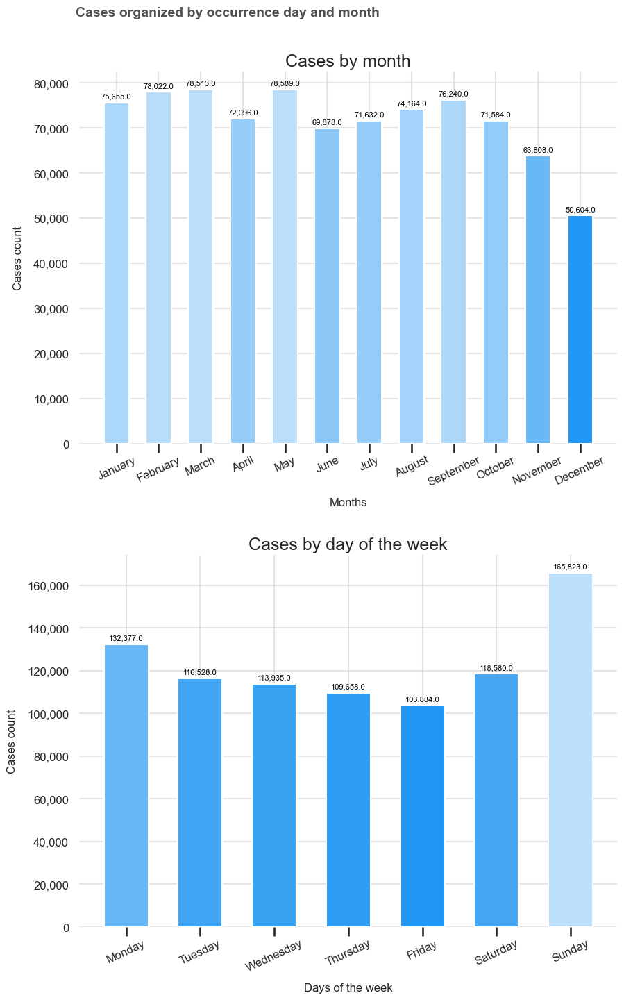

In [79]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,16))
bargraph(x=df_month['month'], y=df_month['cases'], 
         xtitle='Months', ytitle='Cases count', 
         main_title='Cases organized by occurrence day and month', 
         graph_title='Cases by month',
         xlabels=df_month['month'].tolist(), 
         ax=ax1
)

ax1.xaxis.set_tick_params(labelrotation=25)

bargraph(x=df_day['day'], y=df_day['cases'],
         graph_title='Cases by day of the week',
         xtitle='Days of the week', ytitle='Cases count', 
         xlabels=df_day['day'].tolist(), 
         ax=ax2
)

ax2.xaxis.set_tick_params(labelrotation=25)

plt.savefig('../reports/figures/total cases month and day.jpg')
plt.show()

In [34]:
# Daily count of cases
df_date1 = df.groupby('date')['cases'].sum().reset_index()

# Yearly count of cases
df_date2 = df.groupby(df.date.dt.year)['cases'].sum().reset_index()
df_date2 = df_date2.rename({'date':'year'}, axis=1)

In [110]:
def linegraph(x, y, xtitle: str, ytitle: str, main_title: str=None, main_subtitle: str=None, graph_title: str=None, source: str=None, xlabels=None, ylabels=None, ax=None):
    """This functions takes x and y values and turn them into a nice-looking barplot from matplotlib

    Args:
        x (pandas.Series): The data that will go to x label
        
        y (pandas.Series): The data that will go to y label
        
        xtitle (str): title of x label
        
        ytitle (str): title of y label
        
        title (str, optional): Text of main title. Defaults to None.
        
        subtitle (str, optional): Defaults to None.
        
        source (str, optional): Source of information where the data comes from. Defaults to None.
        
        ax (ax, optional): It is used mainly to specify axis on subplots. Defaults to None.

    """
    
    from matplotlib import colors
    from matplotlib.dates import YearLocator
    from matplotlib.dates import DateFormatter
    from matplotlib.ticker import MaxNLocator

    bar1 = ax.plot(x, y, color='#53a9ed')
    ax.grid(alpha=0.5)
    
    
    # Reformat x-axis label and tick labels
    ax.set_xlabel(xtitle, fontsize=12, labelpad=10) # No need for an axis label
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.set_major_locator(YearLocator(1))      #Showing years on xlabel
    ax.xaxis.set_major_formatter(DateFormatter("%Y"))
    ax.xaxis.set_tick_params(labelbottom=True, bottom=True, labelsize=12, labelrotation=0)
    if xlabels:
        ax.set_xticks(x, xlabels) # Map integers numbers from the series to labels list


    # Reformat y-axis
    ax.set_ylabel(ytitle, fontsize=12, labelpad=10)
    ax.yaxis.set_label_position("left")
    ax.yaxis.set_major_formatter(lambda s, i : f'{s:,.0f}')
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.yaxis.set_tick_params(pad=2, labeltop=False, labelbottom=True, bottom=False, labelsize=12)
    if ylabels:
        ax.set_xticks(y, ylabels) # Map integers numbers from the series to labels list
    
    # Remove the spines
    ax.spines[['top','left','bottom','right']].set_visible(False)

    # Make the left spine thicker
    ax.spines['right'].set_linewidth(1.1)
    
    # Graph title
    ax.set_title(graph_title)

    # Add in title and subtitle
    ax.text(x=0.12, y=.93, s=main_title, transform=fig.transFigure, ha='left', fontsize=14, weight='bold', alpha=.8)
    ax.text(x=0.12, y=.90, s=main_subtitle, transform=fig.transFigure, ha='left', fontsize=12, alpha=.8)

    # Set source text
    ax.text(x=0.1, y=0.12, s=source, transform=fig.transFigure, ha='left', fontsize=10, alpha=.7)

    # Adjust the margins around the plot area
    plt.subplots_adjust(left=None, right=None, wspace=None, hspace=0.4)

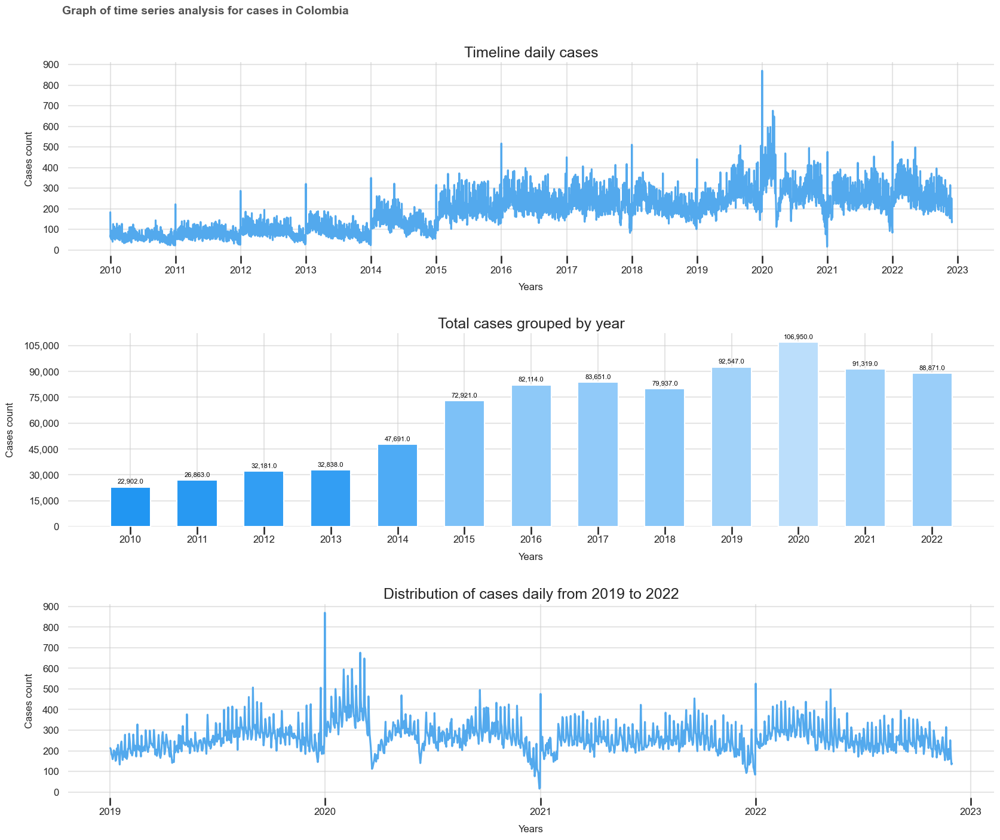

In [109]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(20,16))

linegraph(x=df_date1['date'], y=df_date1['cases'], 
         xtitle='Years', ytitle='Cases count', 
         main_title='Graph of time series analysis for cases in Colombia',
         graph_title='Timeline daily cases',
         ax=ax1
)

bargraph(x=df_date2['year'], y=df_date2['cases'], 
         xtitle='Years', ytitle='Cases count', 
         graph_title='Total cases grouped by year', 
         xlabels=df_date2['year'].tolist(), 
         ax=ax2
)

linegraph(x=df_date1[df_date1['date'] > "2019-01-01"]['date'], 
          y=df_date1[df_date1['date'] > "2019-01-01"]['cases'], 
          xtitle='Years', ytitle='Cases count', 
          graph_title='Distribution of cases daily from 2019 to 2022',
          ax=ax3
)

plt.show()